In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import folium as folium
from folium.plugins import HeatMap,HeatMapWithTime
import pgeocode

# Change settings to display all columns
pd.options.display.max_columns = None

# Create color map
cm = sns.light_palette("green", as_cmap=True)

## Load Data

In [2]:
# Load data
labeled = pd.read_csv("neighborhood.csv", low_memory=False)

In [3]:
labeled.head(5)

,Unnamed: 0,label_1,label_2,POP901,POP902,POP903,POP90C1,AGE901,AGE903,AGE904,HHAGE1,HHP2,HV2,HU1,HU2,HU3,HU4,HU5,IC3,IC4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,LFC4,LFC5,EC1,EC3,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,latitude,longitude
0,0,Active,Label fans,992,264,332,0,39,51,40,26,276,635,86,14,96,4,7,349,378,12883,28,4,51,1,64,44,120,10,0,0,0,18,39,0,41.8055,-89.7054
1,1,Casual,Calendar fans,3611,940,998,99,34,43,32,12,360,5218,96,4,97,3,9,1026,1037,36175,6,2,66,3,81,57,160,5,0,0,0,8,15,0,34.2619,-118.5820
2,2,Active,No preference,7001,2040,2669,0,35,46,37,25,254,546,78,22,93,7,18,292,340,11576,28,8,31,11,70,56,120,20,0,0,0,10,21,0,36.3698,-80.7101
3,3,Active,Notepad fans,640,160,219,0,32,44,34,25,283,1263,48,52,93,7,6,396,423,15130,22,14,26,20,68,45,120,12,0,0,0,13,23,0,39.2601,-121.6923
4,4,Casual,Label fans,18172,5112,6618,81,32,41,33,14,265,899,70,30,93,7,4,406,454,15619,19,3,40,8,77,50,120,14,0,0,0,13,27,1,34.5484,-87.0004


## Visualize our results in interactive map

 - will create a map for Label - 1 (behaviour)
 - Will create a map for Label - 2 (response preference)
 - Will create a map to represent each cluster combination seperately (joined labels)
 
 These maps are in time series and can be opened from html saved in reporsitory.
 Use the legend to ispect how well the clusters are spread within USA and the world

## First partition map

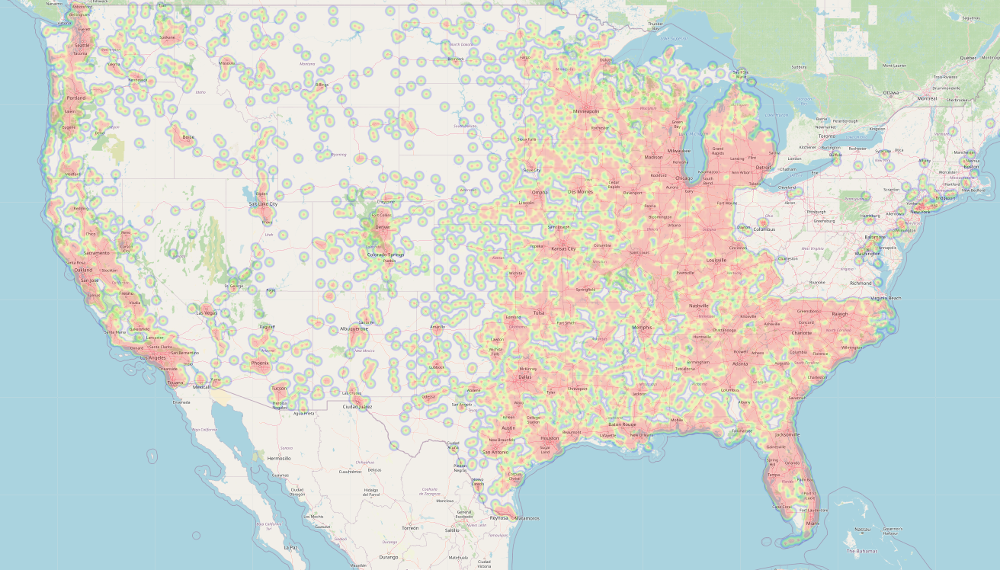

In [4]:
## Will create a heatmap to represent each cluster combination seperately
# using first partition labels [data after RFM]


#initialize the map
first_partition_map = folium.Map(location=[38, -102],zoom_start = 4) 

# Ensure it's floats
labeled['latitude'] = labeled['latitude'].astype(float)
labeled['longitude'] = labeled['longitude'].astype(float)

# create time series based on label values

heat0_df = labeled.sort_values('label_1',ascending=True)
tdata = []
for _, d in heat0_df.groupby(['label_1']):
    tdata.append([[row['latitude'], row['longitude'], row['label_1']] for _, row in d.iterrows()])
# load a plugin
hm = HeatMapWithTime(tdata, auto_play=True,max_opacity=0.2)
hm.add_to(first_partition_map)

# export
first_partition_map.save("first_partition_map.html")

# Display the map
first_partition_map

## Second partition map

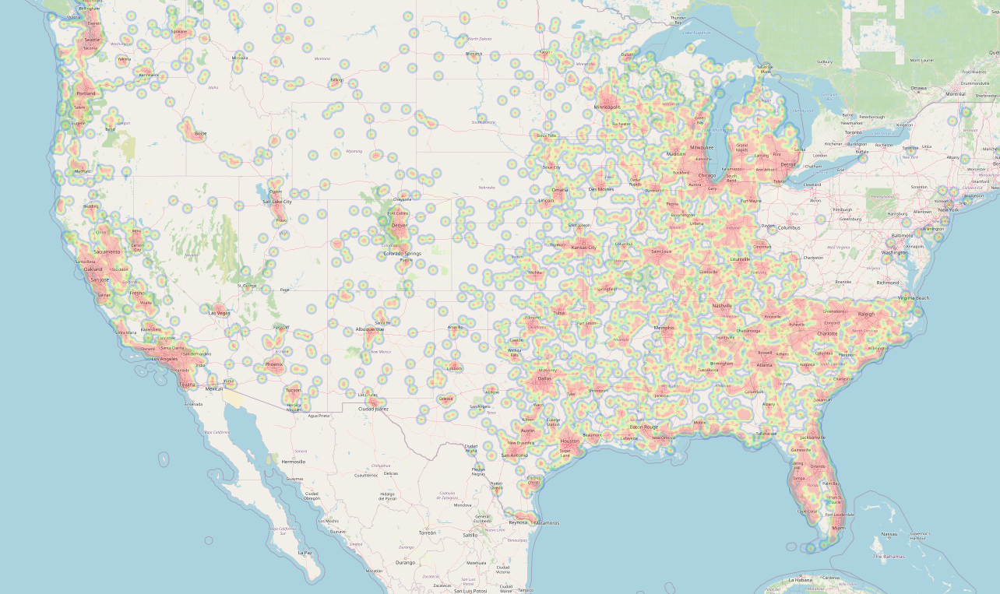

In [5]:
# shall create a map to represent each cluster after second partition despite RFM analysis

#initialize
second_partition_map = folium.Map(location=[38, -102],zoom_start = 4)  

# Ensure it's floats
labeled['latitude'] = labeled['latitude'].astype(float)
labeled['longitude'] = labeled['longitude'].astype(float)

# create time series based on label values

heat0_df = labeled.sort_values('label_2',ascending=True)
tdata = []
for _, d in heat0_df.groupby(['label_2']):
    tdata.append([[row['latitude'], row['longitude'], row['label_2']] for _, row in d.iterrows()])
# load a plugin
hm = HeatMapWithTime(tdata, auto_play=True,max_opacity=0.2)
hm.add_to(second_partition_map)

# export
second_partition_map.save("second_partition_map.html")

# Display the map
second_partition_map

## Final map after creating a dendrogram

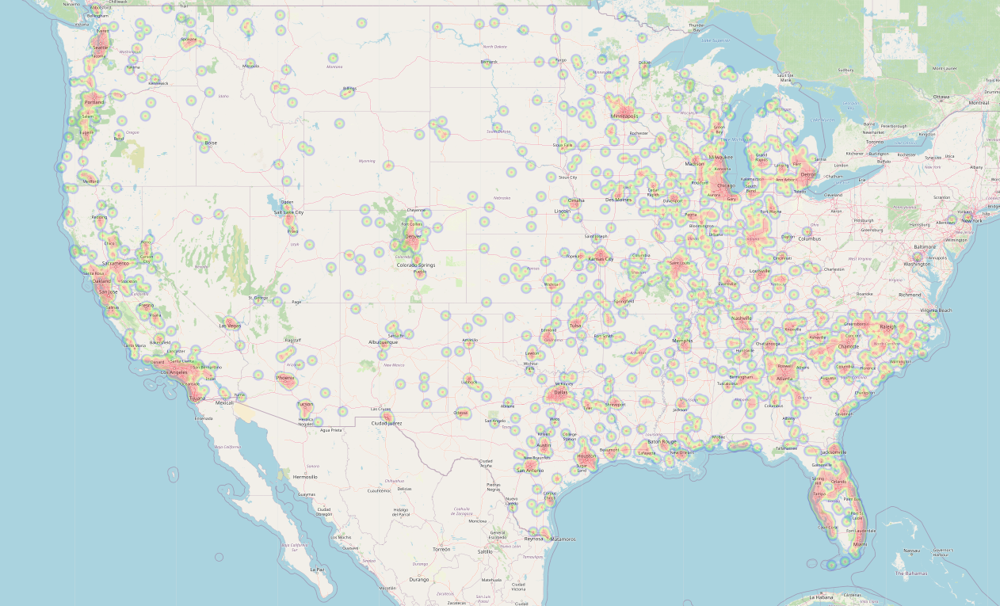

In [6]:
# cheking the results after creating the histogram
# shall create a map to represent each cluster combination seperately (3x6)
print("we can indentify that some clusters are really small, but still spread out through the whole country.")
print("we can also identify that most of donors are located around urban areas in east and west coasts")
print("nevertheless it would be misleading to make any assumptions that relationship exists")
#initialize
cluster_map = folium.Map(location=[38, -102],zoom_start = 4) 

# Ensure it's floats
labeled['latitude'] = labeled['latitude'].astype(float)
labeled['longitude'] = labeled['longitude'].astype(float)

# create time series based on label values

heat0_df = labeled.sort_values('label_1',ascending=True)
tdata = []
for _, d in heat0_df.groupby(['label_1','label_2']):
    tdata.append([[row['latitude'], row['longitude'], row['label_2']] for _, row in d.iterrows()])
# load a plugin
hm = HeatMapWithTime(tdata, auto_play=True,max_opacity=0.2)
hm.add_to(cluster_map)

# export
cluster_map.save("Final_cluster_map.html")

# Display the map
cluster_map

we can indentify that some clusters are really small, but still spread out through the whole country.
we can also identify that most of donors are located around urban areas in east and west coasts
nevertheless it would be misleading to make any assumptions that relationship exists


## Neghborhood data inspection

#### Will inspect the neghborhood data in terms of:  


- Number of People 
- Median Age of Adults   
- Percent Households w/ Person 65+  
- Average Home Value in hundreds 
- Income  
- Percent Adults in Active Military Service  

In [7]:
neighborhood = ['latitude','longitude', 'POP901','POP902','POP903','POP90C1',
                'AGE901','AGE903','AGE904','HHAGE1',
                'HHP2','HV2','HU1','HU2','HU3','HU4','HU5',
                'IC3','IC4','IC5',
                'HHAS1','HHAS2','HHAS3','HHAS4',
                'LFC4','LFC5',
                'EC1','EC3',
                'AFC1','AFC2','AFC3','AFC4','AFC5','AFC6']

# Neighborhood police

In [8]:
def statistics(variable):
    if variable.dtypes == "int64" or variable.dtype == "float64":
        return pd.DataFrame([[variable.name, np.mean(variable), np.std(variable), np.median(variable), np.var(variable)]], 
                            columns = ["Variable", "Mean", "Standard Deviation", "Median", "Variance"]).set_index("Variable")
    else:
        return pd.DataFrame(variable.value_counts())
def graph_histo(x):
    if x.dtype == "int64" or x.dtype == "float64":
        # Select size of bins by getting maximum and minimum and divide the substraction by 10
        size_bins = 10
        # Get the title by getting the name of the column
        title = "Distribution plot"
        #Assign random colors to each graph
        color_kde = list(map(float, np.random.rand(3,)))
        color_bar = list(map(float, np.random.rand(3,)))

        # Plot the displot
        sns.distplot(x, bins=size_bins, kde_kws={"lw": 1.5, "alpha":0.8, "color":color_kde},
                       hist_kws={"linewidth": 1.5, "edgecolor": "grey",
                                "alpha": 0.4, "color":color_bar})
        # Customize ticks and labels
        plt.xticks(size=14)
        plt.yticks(size=14);
        plt.ylabel("Frequency", size=16, labelpad=15);
        # Customize title
        plt.title(title, size=18)
        # Customize grid and axes visibility
        plt.grid(False);
        plt.gca().spines["top"].set_visible(False);
        plt.gca().spines["right"].set_visible(False);
        plt.gca().spines["bottom"].set_visible(False);
        plt.gca().spines["left"].set_visible(False);   
    else:
        x = pd.DataFrame(x)
        # Plot       
        sns.catplot(x=x.columns[0], kind="count", palette="spring", data=x)
        # Customize title
        title = x.columns[0]
        plt.title(title, size=18)
        # Customize ticks and labels
        plt.xticks(size=14)
        plt.yticks(size=14);
        plt.xlabel("")
        plt.ylabel("Counts", size=16, labelpad=15);        
        # Customize grid and axes visibility
        plt.gca().spines["top"].set_visible(False);
        plt.gca().spines["right"].set_visible(False);
        plt.gca().spines["bottom"].set_visible(False);
        plt.gca().spines["left"].set_visible(False);

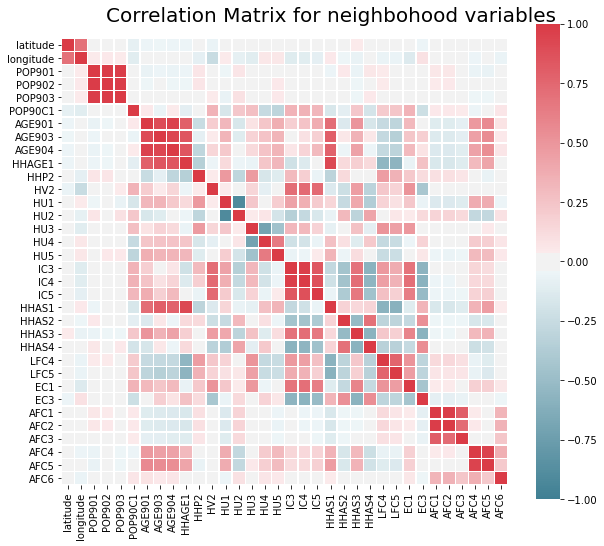

In [9]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(labeled[neighborhood].corr(method="pearson"), decimals=2)

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix for neighbohood variables", fontsize=20)

plt.show()

 - we can identify that some regions are highly correlated. will ispect all and select only the distinctive features

#### After splitting and inspecting every correlated area separately, we chose to use only the following variables

    - EC3         Percent Adults 25+ w/ some High School
    - AGE904      Average Age of Population
    - IC3         Average Household Income in hundreds
    - HHAS3       Percent Households w/ Interest, Rental or Dividend Income
    - AFC4        Percent Adult Veterans Age 16+



In [10]:
# will inspect the correlated areas and look for significance amongst different clusters
clust_0 = pd.DataFrame(labeled[labeled['label_1']== 'Casual'])
clust_1 = pd.DataFrame(labeled[labeled['label_1']== 'Loyal'])
clust_2 = pd.DataFrame(labeled[labeled['label_1']== 'Active'])
clust_0 = clust_0.rename(columns={'AGE904': 'Average_Age', 'IC3': 'Avg_HH_Income', 'HHAS3':'Rental_or_Dividend_Income' ,
                        'AFC4':'Adult_Veterans','EC3':'Hood_Education_lvl'
                       })
clust_1 = clust_1.rename(columns={'AGE904': 'Average_Age', 'IC3': 'Avg_HH_Income', 'HHAS3':'Rental_or_Dividend_Income' ,
                        'AFC4':'Adult_Veterans','EC3':'Hood_Education_lvl'
                       })
clust_2 = clust_2.rename(columns={'AGE904': 'Average_Age', 'IC3': 'Avg_HH_Income', 'HHAS3':'Rental_or_Dividend_Income' ,
                        'AFC4':'Adult_Veterans','EC3':'Hood_Education_lvl'
                       })
hoodie =['Average_Age','Avg_HH_Income','Rental_or_Dividend_Income','Adult_Veterans','Hood_Education_lvl']

In [11]:
statistics(clust_0['Hood_Education_lvl'])

,Mean,Standard Deviation,Median,Variance
Variable,,,,
Hood_Education_lvl,12.709149,7.760158,12.0,60.220052


In [12]:
statistics(clust_1['Hood_Education_lvl'])

,Mean,Standard Deviation,Median,Variance
Variable,,,,
Hood_Education_lvl,12.89191,7.474795,12.0,55.87256


In [13]:
statistics(clust_2['Hood_Education_lvl'])

,Mean,Standard Deviation,Median,Variance
Variable,,,,
Hood_Education_lvl,13.191979,7.44942,13.0,55.493856


In [14]:
# inspection of Neighborhood variables that were selected

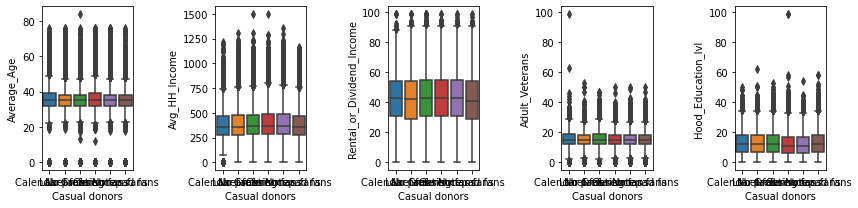

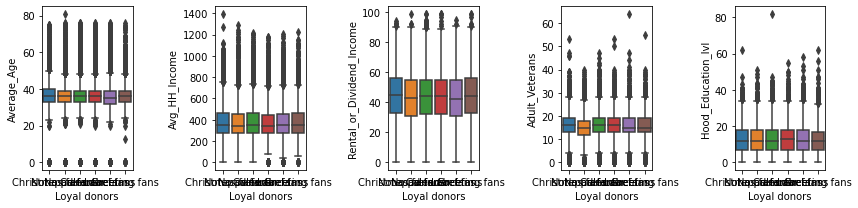

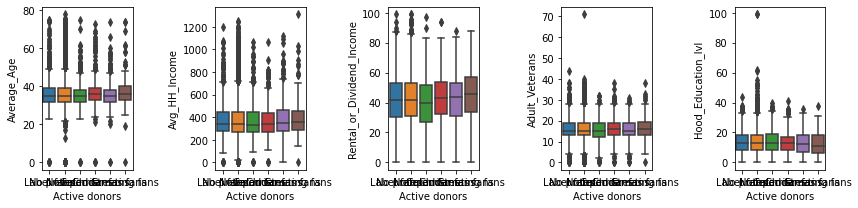

In [15]:
f, axes = plt.subplots(1, 5, figsize=(12,3))

for i in range(len(hoodie)):
    sns.boxplot(y=hoodie[i], x="label_2", data=clust_0[hoodie+["label_2"]], ax=axes[i]).set(xlabel='Casual donors')

plt.tight_layout()


f, axes = plt.subplots(1, 5, figsize=(12,3))

for i in range(len(hoodie)):
    sns.boxplot(y=hoodie[i], x="label_2", data=clust_1[hoodie+["label_2"]], ax=axes[i]).set(xlabel='Loyal donors')
plt.tight_layout()    
f, axes = plt.subplots(1, 5, figsize=(12,3))

for i in range(len(hoodie)):
    sns.boxplot(y=hoodie[i], x="label_2", data=clust_2[hoodie+["label_2"]], ax=axes[i]).set(xlabel='Active donors')
plt.tight_layout()

In [16]:
# check male vs female employment in hood
statistics(labeled['LFC4'])

,Mean,Standard Deviation,Median,Variance
Variable,,,,
LFC4,69.828224,14.97937,72.0,224.381521


In [17]:
statistics(labeled['LFC5'])

,Mean,Standard Deviation,Median,Variance
Variable,,,,
LFC5,52.986813,13.738895,54.0,188.757225


In [18]:
labeled = labeled.rename(columns={'LFC4': 'Adult_Males_Employed', 'LFC5': 'Adult_Females_Employed'})

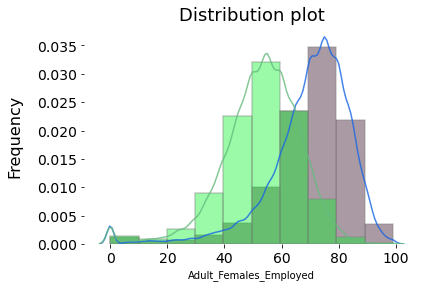

In [19]:
graph_histo(labeled['Adult_Males_Employed'])
graph_histo(labeled['Adult_Females_Employed'])

    - After analysis of the clusters’ neighborhood  variables,  it  became  evident  that  no relationship exists in terms of donors' behavior weighted by neighborhood variables. However, one more fact that is worth mentioning. When it comes to male and female employment rate per  household,  in  general population  an  unequal  distribution  in  terms  of  males  and  females employed exists. 